<a href="https://colab.research.google.com/github/Sarah-0405/Cold_Spots_Bayern/blob/main/Zensusdaten_zuschneiden_visualisieren.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Daten des Zensus 2022 für alle Städte herunterladen (CSV Dateien) mit den Attributen Anteil Menschen mit Migrationshintergrund, Anteil Menschen über 65, Anteil Menschen unter 10 (selbst berechnen)

anschließend visualisieren und erste Auswertungen

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Gitterzellen aller Städte laden  


In [2]:
import os
import geopandas as gpd

# Definieren Sie den Pfad zum Zensus-Ordner in Google Drive
zensus_folder_path = "/content/drive/MyDrive/Cold Spots Bayern/Zensus"

# Erstellen Sie ein leeres Dictionary, um die GeoDataFrames für jede Stadt zu speichern
city_zensus_gdfs = {}

# Überprüfen Sie, ob der Ordner existiert
if os.path.exists(zensus_folder_path):
    # Listen Sie alle Dateien im Ordner auf
    for filename in os.listdir(zensus_folder_path):
        # Überprüfen Sie, ob die Datei eine GeoJSON-Datei ist und mit "gitterzellen_" beginnt
        if filename.endswith(".geojson") and filename.startswith("gitterzellen_"):
            city_name = filename.replace("gitterzellen_", "").replace(".geojson", "")
            file_path = os.path.join(zensus_folder_path, filename)

            try:
                # Laden Sie die GeoJSON-Datei in ein GeoDataFrame
                city_zensus_gdf = gpd.read_file(file_path)

                # Speichern Sie das geladene GeoDataFrame im Dictionary
                city_zensus_gdfs[city_name] = city_zensus_gdf
                print(f"'{filename}' erfolgreich geladen für Stadt: {city_name}")

            except Exception as e:
                print(f"Fehler beim Laden von '{filename}': {e}")

    print(f"\nEs wurden {len(city_zensus_gdfs)} Städte geladen.")

    # Optional: Anzeigen der ersten Zeilen für eine geladene Stadt (z.B. die erste im Dictionary)
    if city_zensus_gdfs:
        first_city_name = list(city_zensus_gdfs.keys())[0]
        print(f"\nErste Zeilen des geladenen GeoDataFrames für {first_city_name}:")
        display(city_zensus_gdfs[first_city_name].head())
else:
    print(f"Der Ordner '{zensus_folder_path}' wurde nicht gefunden. Bitte überprüfen Sie den Pfad.")

# Nun haben Sie ein Dictionary 'city_zensus_gdfs', wobei die Schlüssel die Stadtnamen und die Werte die entsprechenden GeoDataFrames mit den Zensus-Gitterzellen sind.

'gitterzellen_Aschaffenburg.geojson' erfolgreich geladen für Stadt: Aschaffenburg
'gitterzellen_Augsburg.geojson' erfolgreich geladen für Stadt: Augsburg
'gitterzellen_Bamberg.geojson' erfolgreich geladen für Stadt: Bamberg
'gitterzellen_Bayreuth.geojson' erfolgreich geladen für Stadt: Bayreuth
'gitterzellen_Erlangen.geojson' erfolgreich geladen für Stadt: Erlangen
'gitterzellen_Fürth.geojson' erfolgreich geladen für Stadt: Fürth
'gitterzellen_Ingolstadt.geojson' erfolgreich geladen für Stadt: Ingolstadt
'gitterzellen_Kempten_(Allgäu).geojson' erfolgreich geladen für Stadt: Kempten_(Allgäu)
'gitterzellen_Landshut.geojson' erfolgreich geladen für Stadt: Landshut
'gitterzellen_Nuremberg.geojson' erfolgreich geladen für Stadt: Nuremberg
'gitterzellen_Passau.geojson' erfolgreich geladen für Stadt: Passau
'gitterzellen_Regensburg.geojson' erfolgreich geladen für Stadt: Regensburg
'gitterzellen_Munich.geojson' erfolgreich geladen für Stadt: Munich
'gitterzellen_Rosenheim.geojson' erfolgr

,GITTER_ID_100m,x_mp_100m,y_mp_100m,Einwohner,index_right,bbox_west,bbox_south,bbox_east,bbox_north,place_id,...,lat,lon,class,type,place_rank,importance,addresstype,name,display_name,geometry
0,CRS3035RES100mN2979000E4259700,4259750,2979050,8,10,9.080245,49.920061,9.238003,50.021279,114582189,...,49.97067,9.138486,boundary,administrative,12,0.601037,county,Aschaffenburg,"Aschaffenburg, Bavaria, Germany",POINT (4259750 2979050)
1,CRS3035RES100mN2979200E4260000,4260050,2979250,5,10,9.080245,49.920061,9.238003,50.021279,114582189,...,49.97067,9.138486,boundary,administrative,12,0.601037,county,Aschaffenburg,"Aschaffenburg, Bavaria, Germany",POINT (4260050 2979250)
2,CRS3035RES100mN2979200E4260300,4260350,2979250,9,10,9.080245,49.920061,9.238003,50.021279,114582189,...,49.97067,9.138486,boundary,administrative,12,0.601037,county,Aschaffenburg,"Aschaffenburg, Bavaria, Germany",POINT (4260350 2979250)
3,CRS3035RES100mN2979300E4260000,4260050,2979350,3,10,9.080245,49.920061,9.238003,50.021279,114582189,...,49.97067,9.138486,boundary,administrative,12,0.601037,county,Aschaffenburg,"Aschaffenburg, Bavaria, Germany",POINT (4260050 2979350)
4,CRS3035RES100mN2979300E4260200,4260250,2979350,3,10,9.080245,49.920061,9.238003,50.021279,114582189,...,49.97067,9.138486,boundary,administrative,12,0.601037,county,Aschaffenburg,"Aschaffenburg, Bavaria, Germany",POINT (4260250 2979350)


# Attribut-Daten laden

In [3]:
import pandas as pd

In [4]:
Altersgruppen = pd.read_csv("/content/drive/MyDrive/Cold Spots Bayern/Zensus/Kopie von Zensus2022_Alter_in_10er-Jahresgruppen_100m-Gitter.csv", sep=";")
Anteil_Migra = pd.read_csv("/content/drive/MyDrive/Cold Spots Bayern/Zensus/Kopie von Zensus2022_Anteil_Auslaender_100m-Gitter.csv", sep=";")
Anteil_ueber65 = pd.read_csv("/content/drive/MyDrive/Cold Spots Bayern/Zensus/Kopie von Zensus2022_Anteil_ueber_65_100m-Gitter.csv", sep=";")

print(Altersgruppen.head())
print(Anteil_Migra.head())
print(Anteil_ueber65.head())

                   GITTER_ID_100m  x_mp_100m  y_mp_100m  \
0  CRS3035RES100mN2689100E4337000    4337050    2689150   
1  CRS3035RES100mN2689100E4341100    4341150    2689150   
2  CRS3035RES100mN2690800E4341200    4341250    2690850   
3  CRS3035RES100mN2691200E4341200    4341250    2691250   
4  CRS3035RES100mN2691300E4341200    4341250    2691350   

   Insgesamt_Bevoelkerung Unter10 a10bis19 a20bis29 a30bis39 a40bis49  \
0                       4       –        –        –        –        –   
1                      11       –        4        –        –        3   
2                       4       –        –        –        –        –   
3                      12       –        –        6        3        3   
4                       3       –        –        –        –        –   

  a50bis59 a60bis69 a70bis79 a80undaelter  
0        –        –        –            –  
1        –        –        3            –  
2        –        –        –            –  
3        –        –        –  

## Anteil unter 10 berechnen

(Spalte Unter10/Insgesamt_Bevoelkerung)

In [9]:
# Select the required columns
altersgruppen_unter10 = Altersgruppen[['GITTER_ID_100m', 'x_mp_100m', 'y_mp_100m', 'Unter10', 'Insgesamt_Bevoelkerung']].copy()

# Replace '–' with 0 and convert to numeric, coercing errors to NaN
altersgruppen_unter10['Unter10'] = pd.to_numeric(altersgruppen_unter10['Unter10'].replace('–', 0), errors='coerce')
altersgruppen_unter10['Insgesamt_Bevoelkerung'] = pd.to_numeric(altersgruppen_unter10['Insgesamt_Bevoelkerung'].replace('–', 0), errors='coerce')

# Calculate the share of people under 10, handling division by zero
altersgruppen_unter10['Anteil_Unter10'] = (altersgruppen_unter10['Unter10'] / altersgruppen_unter10['Insgesamt_Bevoelkerung']) * 100

# Display the first few rows of the updated DataFrame
display(altersgruppen_unter10.head(50))

,GITTER_ID_100m,x_mp_100m,y_mp_100m,Unter10,Insgesamt_Bevoelkerung,Anteil_Unter10
0,CRS3035RES100mN2689100E4337000,4337050,2689150,0,4,0.0
1,CRS3035RES100mN2689100E4341100,4341150,2689150,0,11,0.0
2,CRS3035RES100mN2690800E4341200,4341250,2690850,0,4,0.0
3,CRS3035RES100mN2691200E4341200,4341250,2691250,0,12,0.0
4,CRS3035RES100mN2691300E4341200,4341250,2691350,0,3,0.0
5,CRS3035RES100mN2691700E4341100,4341150,2691750,0,8,0.0
6,CRS3035RES100mN2691900E4340800,4340850,2691950,0,3,0.0
7,CRS3035RES100mN2692400E4341200,4341250,2692450,0,5,0.0
8,CRS3035RES100mN2692600E4341000,4341050,2692650,0,9,0.0
9,CRS3035RES100mN2692600E4344000,4344050,2692650,0,12,0.0


### Anteil der unter 10-jährigen speichern

In [10]:
# Define the path to save the file in Google Drive
output_path = "/content/drive/MyDrive/Cold Spots Bayern/Zensus/Anteil_Unter10.csv"

# Save the DataFrame to a CSV file
altersgruppen_unter10.to_csv(output_path, index=False, sep=';')

print(f"DataFrame erfolgreich gespeichert unter: {output_path}")

DataFrame erfolgreich gespeichert unter: /content/drive/MyDrive/Cold Spots Bayern/Zensus/Anteil_Unter10.csv


### Anteil der unter 10-jährigen laden

In [5]:
Anteil_unter10 = pd.read_csv("/content/drive/MyDrive/Cold Spots Bayern/Zensus/Anteil_Unter10.csv", sep=";")
print(Anteil_unter10.head())

                   GITTER_ID_100m  x_mp_100m  y_mp_100m  Unter10  \
0  CRS3035RES100mN2689100E4337000    4337050    2689150        0   
1  CRS3035RES100mN2689100E4341100    4341150    2689150        0   
2  CRS3035RES100mN2690800E4341200    4341250    2690850        0   
3  CRS3035RES100mN2691200E4341200    4341250    2691250        0   
4  CRS3035RES100mN2691300E4341200    4341250    2691350        0   

   Insgesamt_Bevoelkerung  Anteil_Unter10  
0                       4             0.0  
1                      11             0.0  
2                       4             0.0  
3                      12             0.0  
4                       3             0.0  


# Attributdaten auf Städte zuschneiden und als csv-Dateien speichern



### Datenaufbereitung der Attributdaten:
Bereinigen und formatieren der Attributdaten (`Anteil_Migra` und `Anteil_ueber65`) um sie für das Zusammenführen vorzubereiten.


In [14]:
# Step 1, 2, and 3 for Anteil_Migra
Anteil_Migra['AnteilAuslaender'] = Anteil_Migra['AnteilAuslaender'].astype(str).str.replace('–', '0').str.replace(',', '.')
Anteil_Migra['AnteilAuslaender'] = pd.to_numeric(Anteil_Migra['AnteilAuslaender'], errors='coerce')

# Step 1, 2, and 3 for Anteil_ueber65
Anteil_ueber65['AnteilUeber65'] = Anteil_ueber65['AnteilUeber65'].astype(str).str.replace('–', '0').str.replace(',', '.')
Anteil_ueber65['AnteilUeber65'] = pd.to_numeric(Anteil_ueber65['AnteilUeber65'], errors='coerce')

# Step 4: Select required columns
Anteil_Migra_cleaned = Anteil_Migra[['GITTER_ID_100m', 'AnteilAuslaender']]
Anteil_ueber65_cleaned = Anteil_ueber65[['GITTER_ID_100m', 'AnteilUeber65']]

# Display the first few rows of the cleaned DataFrames
display(Anteil_Migra_cleaned.head())
display(Anteil_ueber65_cleaned.head())

,GITTER_ID_100m,AnteilAuslaender
0,CRS3035RES100mN2689100E4337000,100.00
1,CRS3035RES100mN2689100E4341100,0.00
2,CRS3035RES100mN2690800E4341200,0.00
3,CRS3035RES100mN2691200E4341200,27.27
4,CRS3035RES100mN2691300E4341200,0.00


,GITTER_ID_100m,AnteilUeber65
0,CRS3035RES100mN2689100E4337000,0.0
1,CRS3035RES100mN2689100E4341100,0.0
2,CRS3035RES100mN2690800E4341200,0.0
3,CRS3035RES100mN2691200E4341200,0.0
4,CRS3035RES100mN2691300E4341200,0.0


### Zusammenführen der daten pro Stadt

Iterieren über das `city_zensus_gdfs` Dictionary und Zusammenführen des entsprechenden Stadt-GeoDataFrames mit den aufbereiteten Attributdaten basierend auf der Gitter-ID.


In [15]:
merged_city_data = {}

for city_name, city_gdf in city_zensus_gdfs.items():
    # Merge with Anteil_unter10
    merged_gdf = city_gdf.merge(Anteil_unter10[['GITTER_ID_100m', 'Anteil_Unter10']],
                                how='left', on='GITTER_ID_100m')

    # Merge with Anteil_Migra_cleaned
    merged_gdf = merged_gdf.merge(Anteil_Migra_cleaned,
                                how='left', on='GITTER_ID_100m')

    # Merge with Anteil_ueber65_cleaned
    merged_gdf = merged_gdf.merge(Anteil_ueber65_cleaned,
                                how='left', on='GITTER_ID_100m')

    merged_city_data[city_name] = merged_gdf
    print(f"Merged data for {city_name}. Shape: {merged_gdf.shape}")

# Display the first few rows of one of the merged GeoDataFrames
if merged_city_data:
    first_city_name = list(merged_city_data.keys())[0]
    print(f"\nFirst few rows of merged data for {first_city_name}:")
    display(merged_city_data[first_city_name].head())

Merged data for Aschaffenburg. Shape: (1425, 25)
Merged data for Augsburg. Shape: (3971, 25)
Merged data for Bamberg. Shape: (1494, 25)
Merged data for Bayreuth. Shape: (1763, 25)
Merged data for Erlangen. Shape: (2161, 25)
Merged data for Fürth. Shape: (2152, 25)
Merged data for Ingolstadt. Shape: (3125, 25)
Merged data for Kempten_(Allgäu). Shape: (1545, 25)
Merged data for Landshut. Shape: (1777, 25)
Merged data for Nuremberg. Shape: (7050, 25)
Merged data for Passau. Shape: (1896, 25)
Merged data for Regensburg. Shape: (2676, 25)
Merged data for Munich. Shape: (15675, 25)
Merged data for Rosenheim. Shape: (1343, 25)
Merged data for Schweinfurt. Shape: (1043, 25)
Merged data for Würzburg. Shape: (2559, 25)

First few rows of merged data for Aschaffenburg:


,GITTER_ID_100m,x_mp_100m,y_mp_100m,Einwohner,index_right,bbox_west,bbox_south,bbox_east,bbox_north,place_id,...,type,place_rank,importance,addresstype,name,display_name,geometry,Anteil_Unter10,AnteilAuslaender,AnteilUeber65
0,CRS3035RES100mN2979000E4259700,4259750,2979050,8,10,9.080245,49.920061,9.238003,50.021279,114582189,...,administrative,12,0.601037,county,Aschaffenburg,"Aschaffenburg, Bavaria, Germany",POINT (4259750 2979050),0.000000,0.0,0.00
1,CRS3035RES100mN2979200E4260000,4260050,2979250,5,10,9.080245,49.920061,9.238003,50.021279,114582189,...,administrative,12,0.601037,county,Aschaffenburg,"Aschaffenburg, Bavaria, Germany",POINT (4260050 2979250),0.000000,0.0,42.86
2,CRS3035RES100mN2979200E4260300,4260350,2979250,9,10,9.080245,49.920061,9.238003,50.021279,114582189,...,administrative,12,0.601037,county,Aschaffenburg,"Aschaffenburg, Bavaria, Germany",POINT (4260350 2979250),33.333333,0.0,0.00
3,CRS3035RES100mN2979300E4260000,4260050,2979350,3,10,9.080245,49.920061,9.238003,50.021279,114582189,...,administrative,12,0.601037,county,Aschaffenburg,"Aschaffenburg, Bavaria, Germany",POINT (4260050 2979350),0.000000,0.0,0.00
4,CRS3035RES100mN2979300E4260200,4260250,2979350,3,10,9.080245,49.920061,9.238003,50.021279,114582189,...,administrative,12,0.601037,county,Aschaffenburg,"Aschaffenburg, Bavaria, Germany",POINT (4260250 2979350),0.000000,0.0,50.00


### Daten für jede Stadt in Drive speichern

In [16]:
import os

# Define the output folder path in Google Drive
output_folder_path = "/content/drive/MyDrive/Cold Spots Bayern/Zensus"

# Create the output folder if it doesn't exist
if not os.path.exists(output_folder_path):
    os.makedirs(output_folder_path)

# Iterate through the merged data and save each city's DataFrame to a CSV file
for city_name, merged_gdf in merged_city_data.items():
    # Define the output file path
    output_file_path = os.path.join(output_folder_path, f"{city_name}_Zensusdaten.csv")

    # Save the DataFrame to a CSV file
    merged_gdf.to_csv(output_file_path, index=False, sep=';')

    print(f"Merged data for {city_name} successfully saved to: {output_file_path}")

Merged data for Aschaffenburg successfully saved to: /content/drive/MyDrive/Cold Spots Bayern/Zensus/Aschaffenburg_Zensusdaten.csv
Merged data for Augsburg successfully saved to: /content/drive/MyDrive/Cold Spots Bayern/Zensus/Augsburg_Zensusdaten.csv
Merged data for Bamberg successfully saved to: /content/drive/MyDrive/Cold Spots Bayern/Zensus/Bamberg_Zensusdaten.csv
Merged data for Bayreuth successfully saved to: /content/drive/MyDrive/Cold Spots Bayern/Zensus/Bayreuth_Zensusdaten.csv
Merged data for Erlangen successfully saved to: /content/drive/MyDrive/Cold Spots Bayern/Zensus/Erlangen_Zensusdaten.csv
Merged data for Fürth successfully saved to: /content/drive/MyDrive/Cold Spots Bayern/Zensus/Fürth_Zensusdaten.csv
Merged data for Ingolstadt successfully saved to: /content/drive/MyDrive/Cold Spots Bayern/Zensus/Ingolstadt_Zensusdaten.csv
Merged data for Kempten_(Allgäu) successfully saved to: /content/drive/MyDrive/Cold Spots Bayern/Zensus/Kempten_(Allgäu)_Zensusdaten.csv
Merged

# gespeicherte Städte-Daten laden

In [6]:
import os
import pandas as pd

# Define the path to the folder containing the saved city data in Google Drive
zensus_folder_path = "/content/drive/MyDrive/Cold Spots Bayern/Zensus"

# Create an empty dictionary to store the DataFrames for each city
loaded_city_data = {}

# Check if the folder exists
if os.path.exists(zensus_folder_path):
    # List all files in the folder
    for filename in os.listdir(zensus_folder_path):
        # Check if the file is a CSV file and ends with "_Zensusdaten.csv"
        if filename.endswith("_Zensusdaten.csv"):
            city_name = filename.replace("_Zensusdaten.csv", "")
            file_path = os.path.join(zensus_folder_path, filename)

            try:
                # Load the CSV file into a DataFrame
                city_df = pd.read_csv(file_path, sep=';')

                # Store the loaded DataFrame in the dictionary
                loaded_city_data[city_name] = city_df
                print(f"'{filename}' erfolgreich geladen für Stadt: {city_name}")

            except Exception as e:
                print(f"Fehler beim Laden von '{filename}': {e}")

    print(f"\nEs wurden {len(loaded_city_data)} Städte geladen.")


else:
    print(f"Der Ordner '{zensus_folder_path}' wurde nicht gefunden. Bitte überprüfen Sie den Pfad.")

# Nun haben Sie ein Dictionary 'loaded_city_data', wobei die Schlüssel die Stadtnamen und die Werte die entsprechenden DataFrames mit den zusammengeführten Zensus-Daten sind.

'Aschaffenburg_Zensusdaten.csv' erfolgreich geladen für Stadt: Aschaffenburg
'Augsburg_Zensusdaten.csv' erfolgreich geladen für Stadt: Augsburg
'Bamberg_Zensusdaten.csv' erfolgreich geladen für Stadt: Bamberg
'Bayreuth_Zensusdaten.csv' erfolgreich geladen für Stadt: Bayreuth
'Erlangen_Zensusdaten.csv' erfolgreich geladen für Stadt: Erlangen
'Fürth_Zensusdaten.csv' erfolgreich geladen für Stadt: Fürth
'Ingolstadt_Zensusdaten.csv' erfolgreich geladen für Stadt: Ingolstadt
'Kempten_(Allgäu)_Zensusdaten.csv' erfolgreich geladen für Stadt: Kempten_(Allgäu)
'Landshut_Zensusdaten.csv' erfolgreich geladen für Stadt: Landshut
'Nuremberg_Zensusdaten.csv' erfolgreich geladen für Stadt: Nuremberg
'Passau_Zensusdaten.csv' erfolgreich geladen für Stadt: Passau
'Regensburg_Zensusdaten.csv' erfolgreich geladen für Stadt: Regensburg
'Munich_Zensusdaten.csv' erfolgreich geladen für Stadt: Munich
'Rosenheim_Zensusdaten.csv' erfolgreich geladen für Stadt: Rosenheim
'Schweinfurt_Zensusdaten.csv' erfolg

# Zensus-Daten visualisieren

### Laden der Stadtgrenzen

In [7]:
# Grenzen der Städte laden für Visualisierung

bayern_grenzen_path = ("/content/drive/MyDrive/Cold Spots Bayern/grenzen_ueber_50tsd.gpkg")

In [8]:
import geopandas as gpd

# Load the GeoJSON file into a GeoDataFrame
bayern_grenzen_gdf = gpd.read_file(bayern_grenzen_path)

# Display the first few rows and print the CRS
display(bayern_grenzen_gdf.head())
print(f"CRS: {bayern_grenzen_gdf.crs}")

,bbox_west,bbox_south,bbox_east,bbox_north,place_id,osm_type,osm_id,lat,lon,class,type,place_rank,importance,addresstype,name,display_name,geometry
0,11.360777,48.061624,11.722910,48.248116,116687199,relation,62428,48.137108,11.575382,boundary,administrative,12,0.799006,city,Munich,"Munich, Bavaria, Germany","MULTIPOLYGON (((11.36078 48.15807, 11.36085 48..."
1,10.988733,49.331434,11.282596,49.540753,115962439,relation,62780,49.453872,11.077298,boundary,administrative,12,0.709195,city,Nuremberg,"Nuremberg, Bavaria, Germany","MULTIPOLYGON (((10.98873 49.53654, 10.98906 49..."
2,10.763362,48.258144,10.959333,48.458654,116219980,relation,62407,48.369034,10.897952,boundary,administrative,12,0.679385,city,Augsburg,"Augsburg, Bavaria, Germany","MULTIPOLYGON (((10.76336 48.30213, 10.76336 48..."
3,12.029075,48.966746,12.191608,49.076416,119951011,relation,62411,49.019533,12.097487,boundary,administrative,12,0.670191,city,Regensburg,"Regensburg, Bavaria, Germany","MULTIPOLYGON (((12.02907 49.01102, 12.02908 49..."
4,11.255908,48.683877,11.503422,48.822891,116627625,relation,62381,48.763016,11.425040,boundary,administrative,12,0.625744,city,Ingolstadt,"Ingolstadt, Bavaria, Germany","MULTIPOLYGON (((11.25591 48.77946, 11.25634 48..."


CRS: EPSG:4326


### Datenaufbereitung und crs-transformation


In [18]:
import geopandas as gpd
from shapely.geometry import Polygon
import pandas as pd

transformed_city_gdfs = {}

target_crs = bayern_grenzen_gdf.crs

for city_name, city_df in loaded_city_data.items():
    # Convert DataFrame to GeoDataFrame
    # Ensure 'x_mp_100m' and 'y_mp_100m' are numeric
    city_df['x_mp_100m'] = pd.to_numeric(city_df['x_mp_100m'], errors='coerce')
    city_df['y_mp_100m'] = pd.to_numeric(city_df['y_mp_100m'], errors='coerce')

    # Drop rows where conversion failed
    city_df.dropna(subset=['x_mp_100m', 'y_mp_100m'], inplace=True)

    # Create 100x100m square polygons around the center points
    # Assuming the original CRS of x_mp_100m and y_mp_100m is EPSG:3035 (as indicated in previous code)
    grid_polygons = []
    for index, row in city_df.iterrows():
        x, y = row['x_mp_100m'], row['y_mp_100m']
        # Calculate the corners of the 100x100m square
        # The coordinates are likely the center of the bottom-left corner of the grid cell in EPSG:3035,
        # so we need to adjust to get the corners of the square centered at (x, y).
        # However, the column names suggest x_mp_100m and y_mp_100m are midpoints.
        # Let's assume they are midpoints and create a square centered at these points.
        half_side = 50 # half of the 100m side
        polygon = Polygon([(x - half_side, y - half_side),
                           (x + half_side, y - half_side),
                           (x + half_side, y + half_side),
                           (x - half_side, y + half_side)])
        grid_polygons.append(polygon)

    # Create a GeoDataFrame with the new polygon geometries
    city_gdf = gpd.GeoDataFrame(city_df, geometry=grid_polygons, crs="EPSG:3035")

    # Transform CRS to the target CRS (EPSG:4326, the CRS of bayern_grenzen_gdf)
    city_gdf_transformed = city_gdf.to_crs(target_crs)

    transformed_city_gdfs[city_name] = city_gdf_transformed
    print(f"Transformed data for {city_name}. CRS: {city_gdf_transformed.crs}")

# Display the first few rows and CRS of the first transformed GeoDataFrame
if transformed_city_gdfs:
    first_city_name = list(transformed_city_gdfs.keys())[0]
    print(f"\nFirst few rows of transformed GeoDataFrame for {first_city_name}:")
    display(transformed_city_gdfs[first_city_name].head())
    print(f"CRS of transformed GeoDataFrame: {transformed_city_gdfs[first_city_name].crs}")

Transformed data for Aschaffenburg. CRS: EPSG:4326
Transformed data for Augsburg. CRS: EPSG:4326
Transformed data for Bamberg. CRS: EPSG:4326
Transformed data for Bayreuth. CRS: EPSG:4326
Transformed data for Erlangen. CRS: EPSG:4326
Transformed data for Fürth. CRS: EPSG:4326
Transformed data for Ingolstadt. CRS: EPSG:4326
Transformed data for Kempten_(Allgäu). CRS: EPSG:4326
Transformed data for Landshut. CRS: EPSG:4326
Transformed data for Nuremberg. CRS: EPSG:4326
Transformed data for Passau. CRS: EPSG:4326
Transformed data for Regensburg. CRS: EPSG:4326
Transformed data for Munich. CRS: EPSG:4326
Transformed data for Rosenheim. CRS: EPSG:4326
Transformed data for Schweinfurt. CRS: EPSG:4326
Transformed data for Würzburg. CRS: EPSG:4326

First few rows of transformed GeoDataFrame for Aschaffenburg:


,GITTER_ID_100m,x_mp_100m,y_mp_100m,Einwohner,index_right,bbox_west,bbox_south,bbox_east,bbox_north,place_id,...,type,place_rank,importance,addresstype,name,display_name,geometry,Anteil_Unter10,AnteilAuslaender,AnteilUeber65
0,CRS3035RES100mN2979000E4259700,4259750,2979050,8,10,9.080245,49.920061,9.238003,50.021279,114582189,...,administrative,12,0.601037,county,Aschaffenburg,"Aschaffenburg, Bavaria, Germany","POLYGON ((9.14649 49.92027, 9.14789 49.92028, ...",0.000000,0.0,0.00
1,CRS3035RES100mN2979200E4260000,4260050,2979250,5,10,9.080245,49.920061,9.238003,50.021279,114582189,...,administrative,12,0.601037,county,Aschaffenburg,"Aschaffenburg, Bavaria, Germany","POLYGON ((9.15064 49.9221, 9.15203 49.92211, 9...",0.000000,0.0,42.86
2,CRS3035RES100mN2979200E4260300,4260350,2979250,9,10,9.080245,49.920061,9.238003,50.021279,114582189,...,administrative,12,0.601037,county,Aschaffenburg,"Aschaffenburg, Bavaria, Germany","POLYGON ((9.15482 49.92213, 9.15621 49.92214, ...",33.333333,0.0,0.00
3,CRS3035RES100mN2979300E4260000,4260050,2979350,3,10,9.080245,49.920061,9.238003,50.021279,114582189,...,administrative,12,0.601037,county,Aschaffenburg,"Aschaffenburg, Bavaria, Germany","POLYGON ((9.15062 49.923, 9.15202 49.92301, 9....",0.000000,0.0,0.00
4,CRS3035RES100mN2979300E4260200,4260250,2979350,3,10,9.080245,49.920061,9.238003,50.021279,114582189,...,administrative,12,0.601037,county,Aschaffenburg,"Aschaffenburg, Bavaria, Germany","POLYGON ((9.15341 49.92302, 9.1548 49.92303, 9...",0.000000,0.0,50.00


CRS of transformed GeoDataFrame: EPSG:4326


## Bestimmen der globalen farbbereiche



In [19]:
import numpy as np

# 1. Initialize a dictionary to store the global minima and maxima
global_min_max = {}

# 2. Define a list of attributes
attributes_to_visualize = ['Anteil_Unter10', 'AnteilAuslaender', 'AnteilUeber65']

# Initialize global min and max for each attribute
for attribute in attributes_to_visualize:
    global_min_max[attribute] = {'min': float('inf'), 'max': float('-inf')}

# 3. Iterate through each city in the transformed_city_gdfs dictionary
for city_name, city_gdf in transformed_city_gdfs.items():
    # 4. For each city and each attribute
    for attribute in attributes_to_visualize:
        # Calculate the minimum and maximum value of the attribute in the current GeoDataFrame
        current_min = city_gdf[attribute].min()
        current_max = city_gdf[attribute].max()

        # Update the global minima and maxima
        if current_min < global_min_max[attribute]['min']:
            global_min_max[attribute]['min'] = current_min
        if current_max > global_min_max[attribute]['max']:
            global_min_max[attribute]['max'] = current_max

# Replace infinite values with NaN if no data was processed for an attribute
for attribute in attributes_to_visualize:
    if global_min_max[attribute]['min'] == float('inf'):
        global_min_max[attribute]['min'] = np.nan
    if global_min_max[attribute]['max'] == float('-inf'):
        global_min_max[attribute]['max'] = np.nan

# 5. Print the dictionary with the global minima and maxima
print("Global Minima and Maxima for Attributes:")
print(global_min_max)

Global Minima and Maxima for Attributes:
{'Anteil_Unter10': {'min': 0.0, 'max': 133.33333333333331}, 'AnteilAuslaender': {'min': 0.0, 'max': 100.0}, 'AnteilUeber65': {'min': 0.0, 'max': 100.0}}


## Erstellen und Speichern der plots


In [13]:
!pip install contextily

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.3/22.3 MB 72.6 MB/s eta 0:00:00


Creating plots for Aschaffenburg...


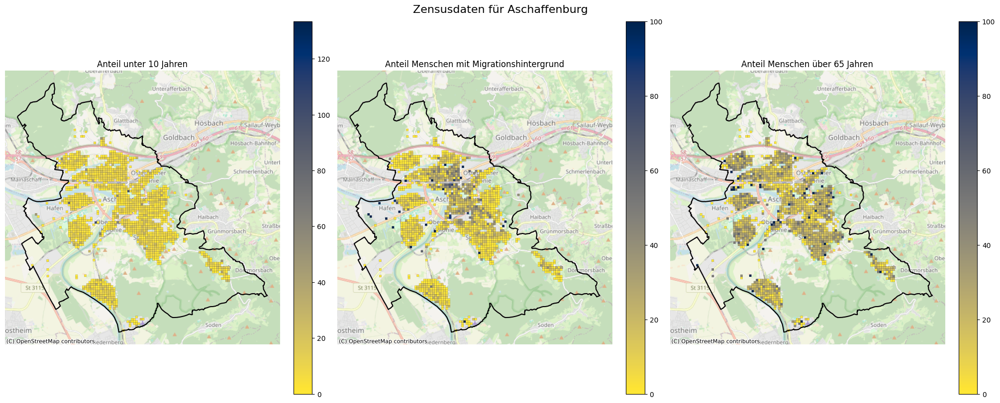

Creating plots for Augsburg...


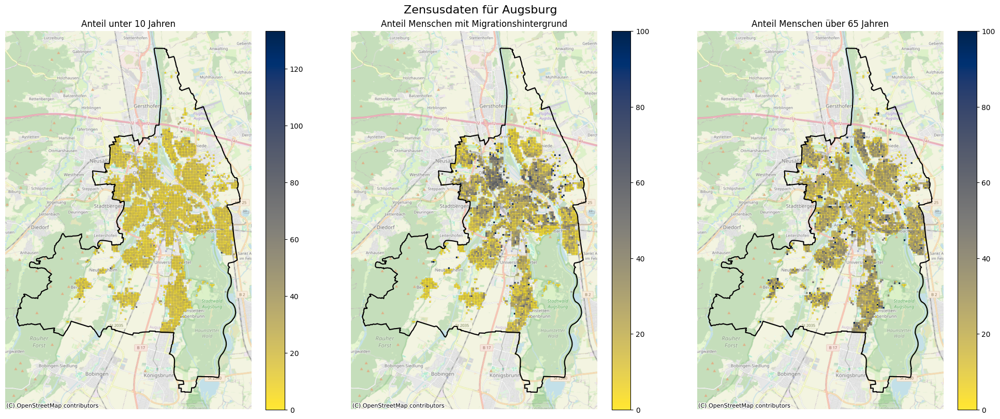

Creating plots for Bamberg...


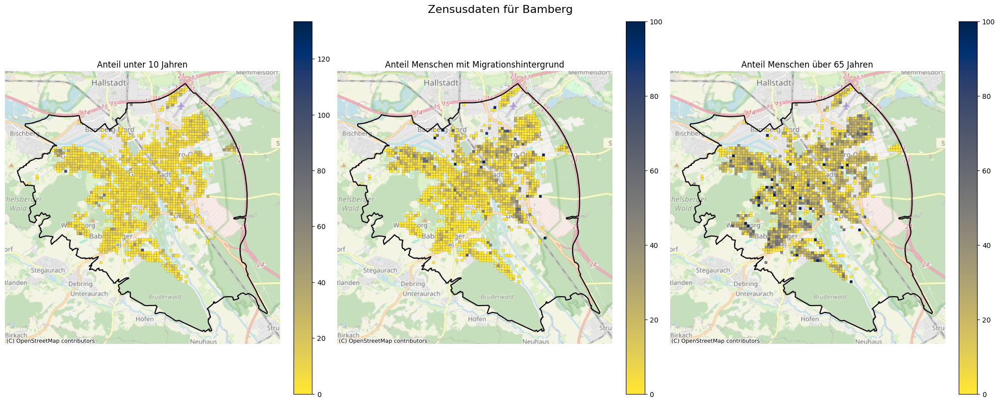

Creating plots for Bayreuth...


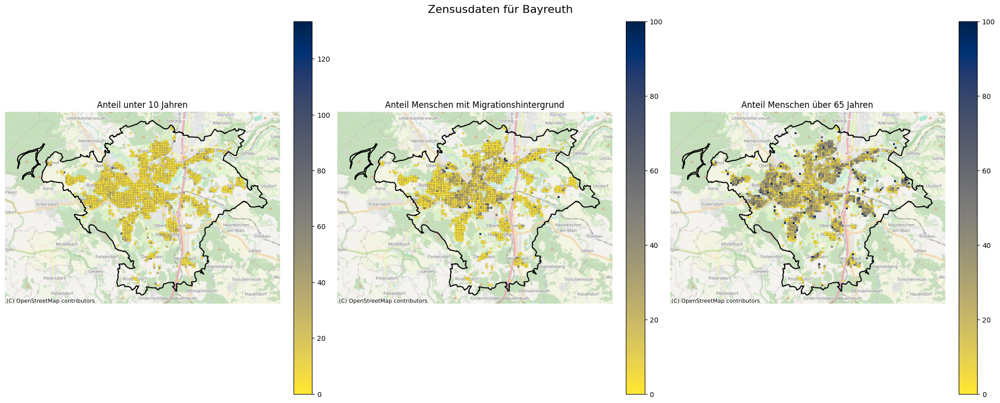

Creating plots for Erlangen...


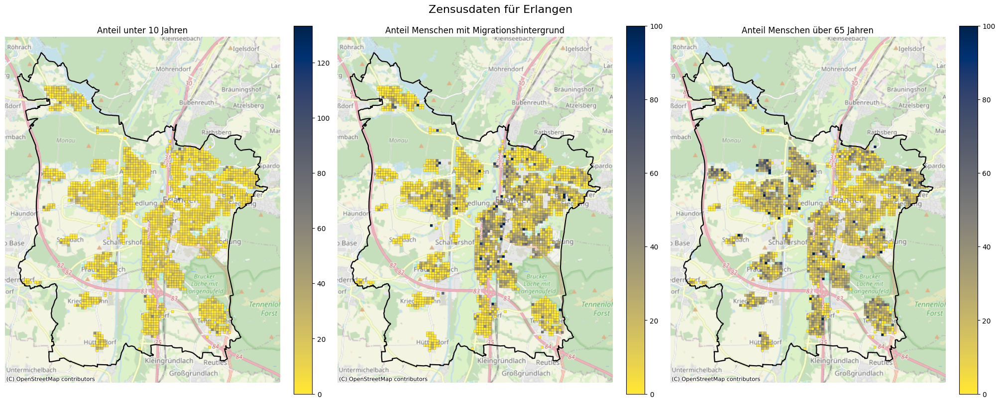

Creating plots for Fürth...


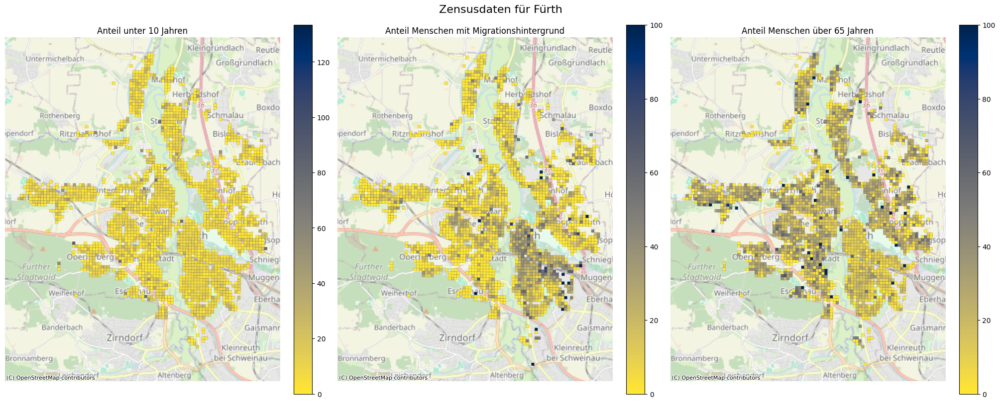

Creating plots for Ingolstadt...


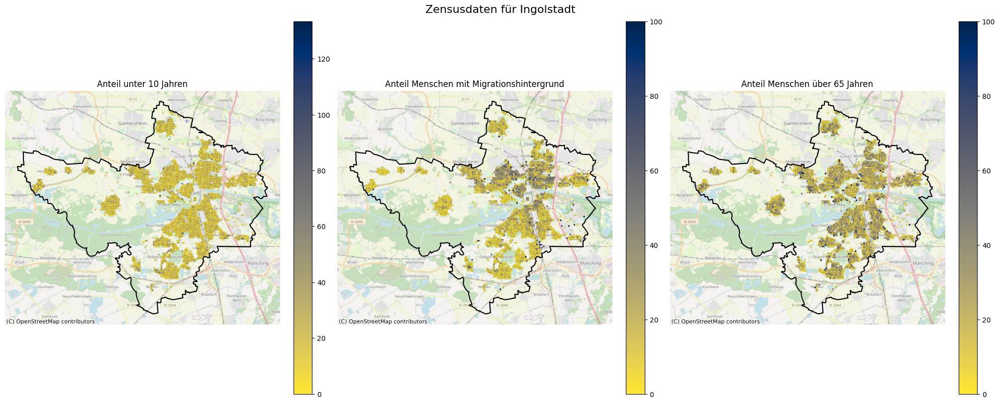

Creating plots for Kempten_(Allgäu)...


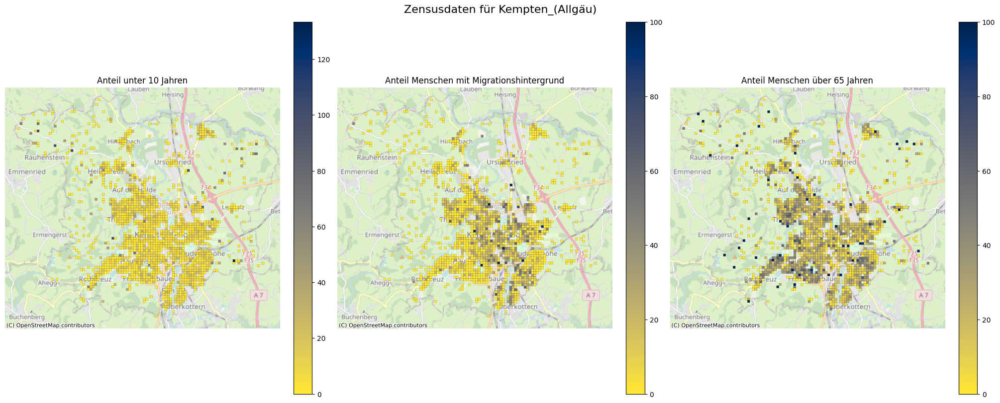

Creating plots for Landshut...


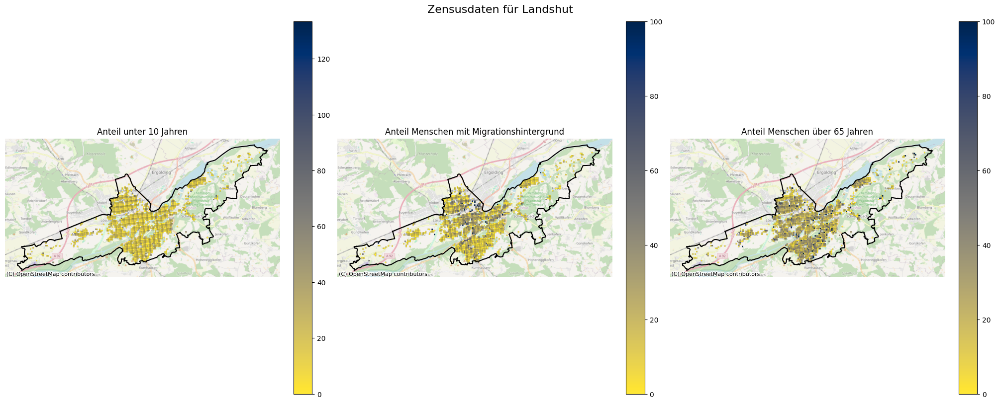

Creating plots for Nuremberg...


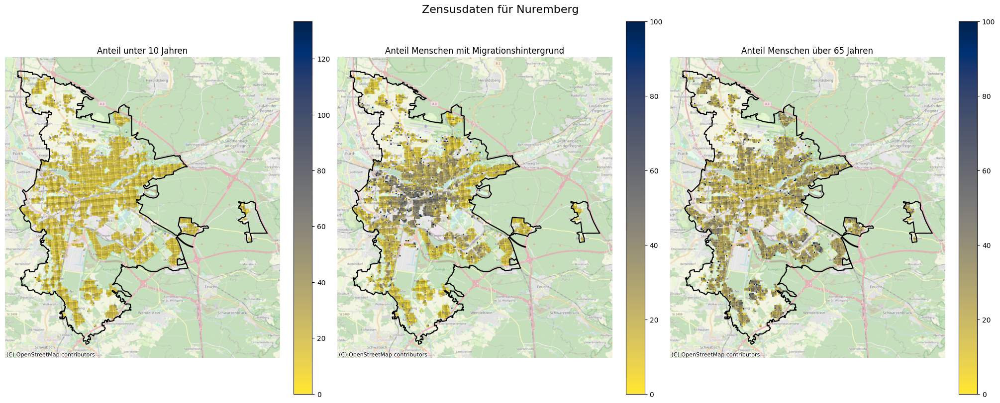

Creating plots for Passau...


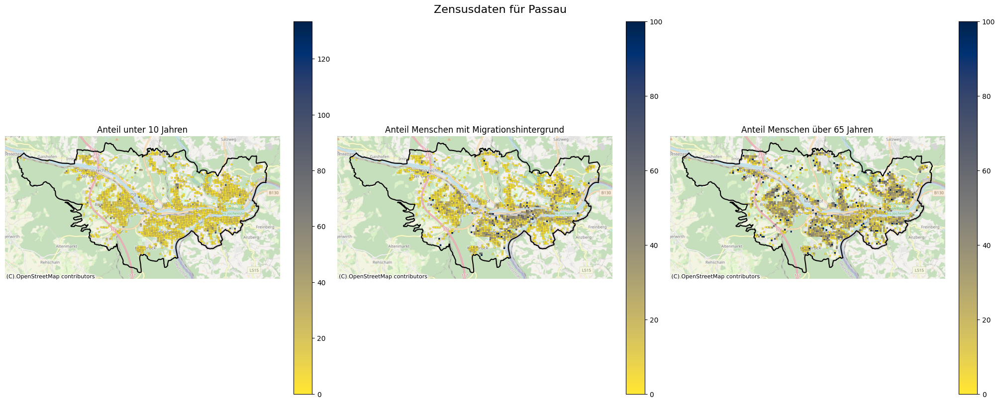

Creating plots for Regensburg...


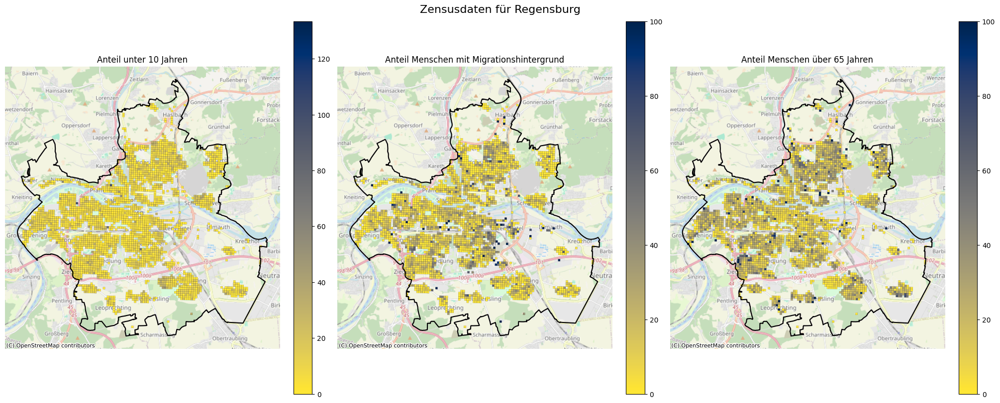

Creating plots for Munich...


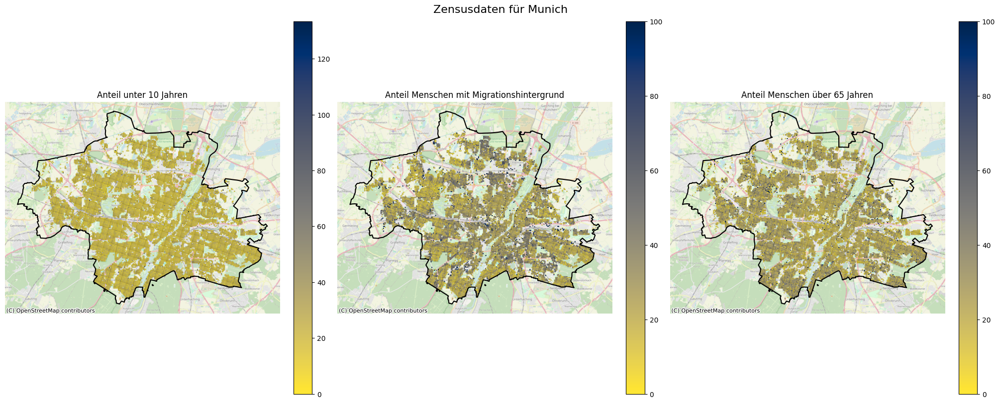

Creating plots for Rosenheim...


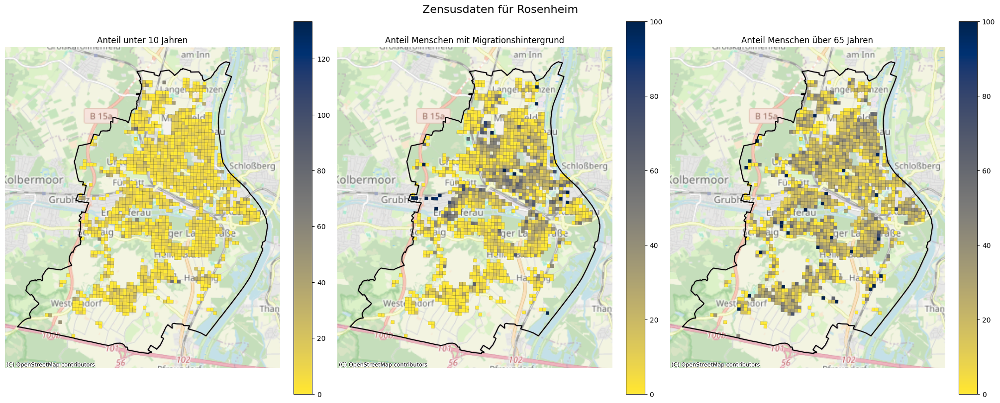

Creating plots for Schweinfurt...


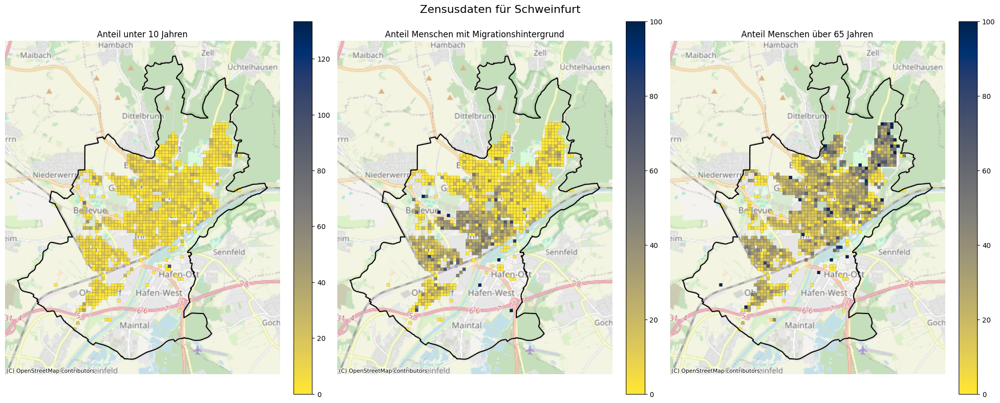

Creating plots for Würzburg...


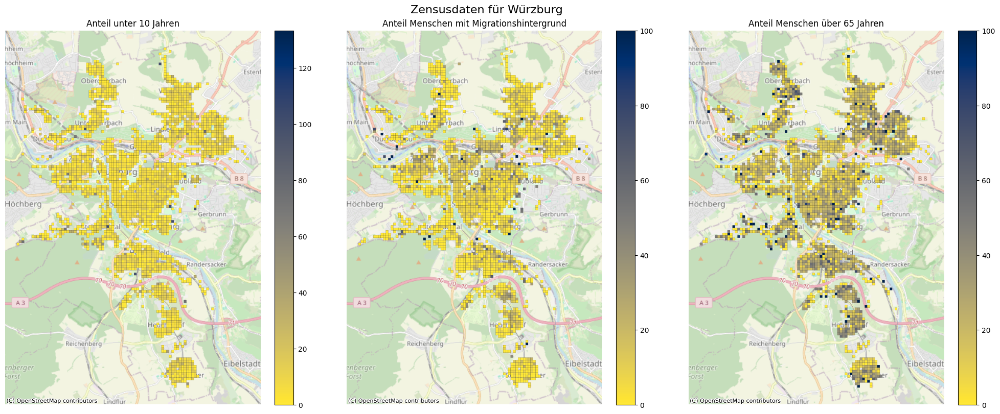

In [24]:
import matplotlib.pyplot as plt
import contextily as ctx

attributes_to_map = ['Anteil_Unter10', 'AnteilAuslaender', 'AnteilUeber65']
attribute_titles = {
    'Anteil_Unter10': 'Anteil unter 10 Jahren',
    'AnteilAuslaender': 'Anteil Menschen mit Migrationshintergrund',
    'AnteilUeber65': 'Anteil Menschen über 65 Jahren'
}

# Use the global min/max values determined earlier for consistent color scales
global_min_max = {
    'Anteil_Unter10': {'min': 0.0, 'max': 133.33333333333331},
    'AnteilAuslaender': {'min': 0.0, 'max': 100.0},
    'AnteilUeber65': {'min': 0.0, 'max': 100.0}
}


# Iterate through each city in the transformed_city_gdfs dictionary
for city_name, city_gdf in transformed_city_gdfs.items():
    print(f"Creating plots for {city_name}...")

    # Create a figure and a set of subplots for the city
    fig, axes = plt.subplots(1, len(attributes_to_map), figsize=(20, 8), constrained_layout=True)
    fig.suptitle(f'Zensusdaten für {city_name}', fontsize=16)

    # Reproject the city GeoDataFrame to Web Mercator (EPSG:3857) for contextily
    city_gdf_webmercator = city_gdf.to_crs(epsg=3857)

    for i, attribute in enumerate(attributes_to_map):
        ax = axes[i]

        # Plot the choropleth map for the current attribute using the polygon geometries
        # Ensure the geometry column is active on the reprojected GeoDataFrame
        city_gdf_webmercator = city_gdf_webmercator.set_geometry('geometry')

        city_gdf_webmercator.plot(column=attribute,
                      ax=ax,
                      legend=True,
                      vmin=global_min_max[attribute]['min'], # Use global min
                      vmax=global_min_max[attribute]['max'], # Use global max
                      cmap='cividis_r', # Changed colormap to 'cividis'
                      missing_kwds={'color': 'lightgrey', 'label': 'Missing data'}, # Handle missing data
                      edgecolor='black', # Add edge color to see grid cells
                      linewidth=0.1) # Adjust line width as needed


        # Add city boundaries (reprojected to Web Mercator as well)
        city_boundary = bayern_grenzen_gdf[bayern_grenzen_gdf['name'] == city_name]
        if not city_boundary.empty:
            city_boundary_webmercator = city_boundary.to_crs(epsg=3857)
            city_boundary_webmercator.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1.5)


        # Add background map
        # Specify a valid zoom level (e.g., 12 or adjust as needed)
        try:
            ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, alpha=0.7, zoom=12) # Added zoom level
        except Exception as e:
            print(f"Could not add basemap for {city_name}: {e}")


        # Set title for the subplot
        ax.set_title(attribute_titles[attribute])
        ax.set_axis_off() # Turn off axes

    # Display the plot for the current city
    plt.show()

## Daten als Plot darstellen (Mittelwerte der Attribute)

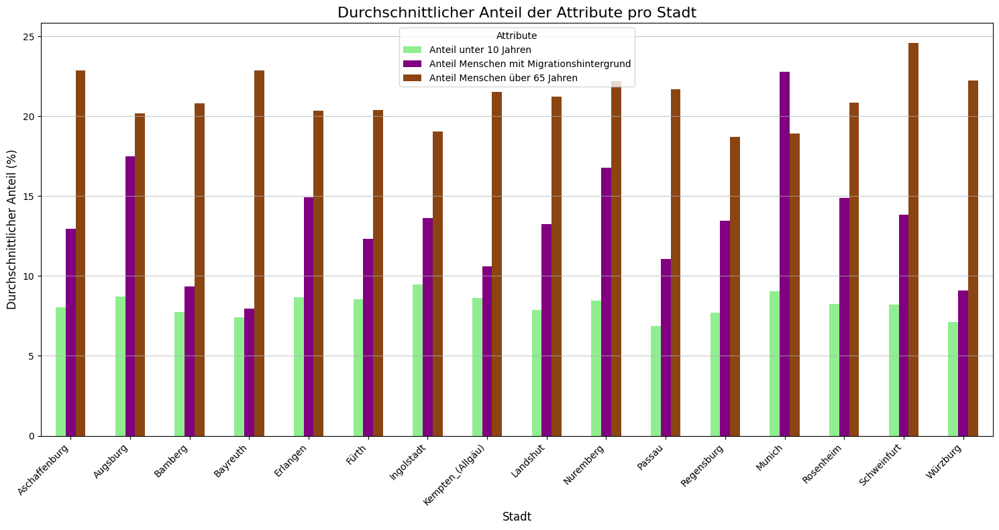

In [25]:
import matplotlib.pyplot as plt
import pandas as pd

attributes_to_analyze = ['Anteil_Unter10', 'AnteilAuslaender', 'AnteilUeber65']
attribute_titles = {
    'Anteil_Unter10': 'Anteil unter 10 Jahren',
    'AnteilAuslaender': 'Anteil Menschen mit Migrationshintergrund',
    'AnteilUeber65': 'Anteil Menschen über 65 Jahren'
}

# Define colors for each attribute
attribute_colors = {
    'Anteil_Unter10': 'lightgreen',
    'AnteilAuslaender': 'purple',
    'AnteilUeber65': 'saddlebrown' # Using saddlebrown for brown
}


# Calculate the mean of each attribute for each city
city_attribute_means = {}
for city_name, city_gdf in transformed_city_gdfs.items():
    city_attribute_means[city_name] = {}
    for attribute in attributes_to_analyze:
        # Calculate mean, handling potential NaN values
        mean_value = city_gdf[attribute].mean()
        city_attribute_means[city_name][attribute] = mean_value

# Convert the dictionary of means to a pandas DataFrame for easier plotting
city_means_df = pd.DataFrame(city_attribute_means).T # Transpose to have cities as index

# Create the bar plot
fig, ax = plt.subplots(figsize=(15, 8))

# Plot bars for each attribute
city_means_df[attributes_to_analyze].plot(kind='bar', ax=ax, color=[attribute_colors[attr] for attr in attributes_to_analyze])

# Set titles and labels
ax.set_title('Durchschnittlicher Anteil der Attribute pro Stadt', fontsize=16)
ax.set_xlabel('Stadt', fontsize=12)
ax.set_ylabel('Durchschnittlicher Anteil (%)', fontsize=12)
ax.set_xticklabels(city_means_df.index, rotation=45, ha='right') # Rotate labels for readability
ax.legend(title='Attribute', labels=[attribute_titles[attr] for attr in attributes_to_analyze])

# Add grid lines for better readability
ax.yaxis.grid(True, linestyle='-', alpha=0.7)

# Adjust layout to prevent labels overlapping
plt.tight_layout()

# Display the plot
plt.show()